### Se pide:

A partir del archivo "USA_Housing.csv", realizar la regresión lineal entre cada columna numérica con la columna 'price'. 

Cuando existe una columna(variable) que es la que se quiere comparar, se le llama 'target'. 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

In [2]:
df = pd.read_csv("../data/USA_Housing.csv")
df

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386
...,...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,USNS Williams\nFPO AP 30153-7653
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,"PSC 9258, Box 8489\nAPO AA 42991-3352"
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,"4215 Tracy Garden Suite 076\nJoshualand, VA 01..."
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,USS Wallace\nFPO AE 73316


In [3]:
y = df['Price']

In [4]:
X_AI = df[['Avg. Area Income']]
X_AI

,Avg. Area Income
0,79545.458574
1,79248.642455
2,61287.067179
3,63345.240046
4,59982.197226
...,...
4995,60567.944140
4996,78491.275435
4997,63390.686886
4998,68001.331235


In [5]:
X_AI.shape

(5000, 1)

In [6]:
y.shape

(5000,)

In [7]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

train_errors, val_errors = [], []

def plot_learning_curves(model, X, Y):
    # 80% de Train
    # 20% de Test
    X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size=0.2)
    
    for m in range(1, len(X_train)):  # Incremental
        x = X_train[:m]
        y = y_train[:m]
        model.fit(x, y)

        y_train_predict = model.predict(x)
        y_val_predict = model.predict(X_val)

        train_errors.append(mean_squared_error(y, y_train_predict))
        val_errors.append(mean_squared_error(y_val, y_val_predict))
        
        if m < 4:
            print("##### ITERACIÓN " + str(m) + " #####")
            print("x", x)
            print("y", y)
            print("y_train_predict", y_train_predict)
            # print("-----\nX_val\n", X_val)
            # print("y_val_predict", y_val_predict)

    plt.plot(train_errors, "r-+", linewidth=2, label="train")
    plt.plot(val_errors, "b-", linewidth=3, label="val")
    plt.show()

##### ITERACIÓN 1 #####
x       Avg. Area Income
2428      72353.580955
y 2428    959243.608449
Name: Price, dtype: float64
y_train_predict [959243.60844873]
##### ITERACIÓN 2 #####
x       Avg. Area Income
2428      72353.580955
881       62058.502459
y 2428    9.592436e+05
881     1.114779e+06
Name: Price, dtype: float64
y_train_predict [ 959243.60844873 1114779.24664095]
##### ITERACIÓN 3 #####
x       Avg. Area Income
2428      72353.580955
881       62058.502459
2611      68776.666704
y 2428    9.592436e+05
881     1.114779e+06
2611    1.331656e+06
Name: Price, dtype: float64
y_train_predict [1093580.19131149 1186303.31484573 1125795.84290606]


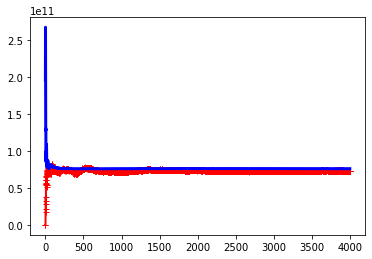

In [8]:
lin_reg = LinearRegression()
plot_learning_curves(model=lin_reg, X=X_AI, Y=y)

In [9]:
def predict(model, number):
    to_predict = np.array([number]).reshape(1, -1)
    return model.predict(to_predict)

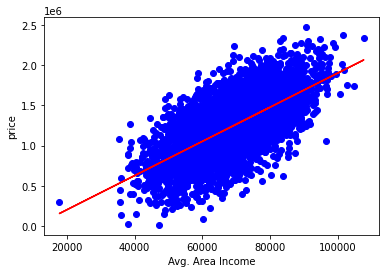

In [10]:
plt.scatter(X_AI, y, color='b')
plt.plot(X_AI, lin_reg.predict(X_AI), color='red')
plt.ylabel('price')
plt.xlabel('Avg. Area Income')
plt.show()

In [11]:
print(df.columns)
df.columns[0]

Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population', 'Price', 'Address'],
      dtype='object')


'Avg. Area Income'

In [12]:
def lr_df(df_name):
    y = df_name['Price']
    for i in range(len(df_name.columns)-1):
        X = df_name[[df_name.columns[i]]]
        lin_reg = LinearRegression()
        plot_learning_curves(model=lin_reg, X=X, Y=y)
        plt.scatter(X, y, color='b')
        plt.plot(X, lin_reg.predict(X), color='red')
        plt.ylabel('price')
        plt.xlabel(df_name.columns[i])
        plt.show()

In [13]:
df_short = df[['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms', 'Avg. Area Number of Bedrooms', 'Area Population', 'Price']]
df_short

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05
...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06


##### ITERACIÓN 1 #####
x       Avg. Area Income
2373      75299.612566
y 2373    1.659100e+06
Name: Price, dtype: float64
y_train_predict [1659100.12428637]
##### ITERACIÓN 2 #####
x       Avg. Area Income
2373      75299.612566
1490      84913.976755
y 2373    1.659100e+06
1490    1.409684e+06
Name: Price, dtype: float64
y_train_predict [1659100.12428637 1409684.48511891]
##### ITERACIÓN 3 #####
x       Avg. Area Income
2373      75299.612566
1490      84913.976755
728       66887.152430
y 2373    1.659100e+06
1490    1.409684e+06
728     1.009142e+06
Name: Price, dtype: float64
y_train_predict [1350863.92265253 1553527.05615661 1173535.96857017]


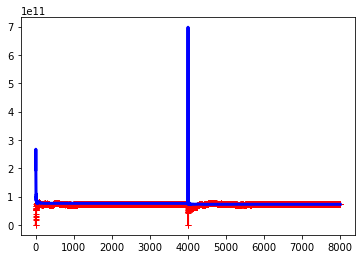

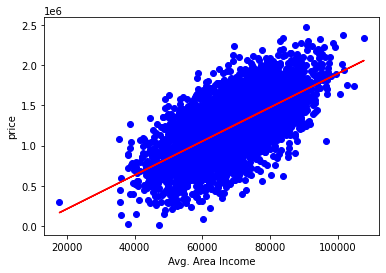

##### ITERACIÓN 1 #####
x       Avg. Area House Age
2912             6.892307
y 2912    1.366981e+06
Name: Price, dtype: float64
y_train_predict [1366980.90988088]
##### ITERACIÓN 2 #####
x       Avg. Area House Age
2912             6.892307
2715             5.364399
y 2912    1.366981e+06
2715    8.342683e+05
Name: Price, dtype: float64
y_train_predict [1366980.90988088  834268.34292106]
##### ITERACIÓN 3 #####
x       Avg. Area House Age
2912             6.892307
2715             5.364399
4672             5.454743
y 2912    1.366981e+06
2715    8.342683e+05
4672    1.076439e+06
Name: Price, dtype: float64
y_train_predict [1373576.25248711  939214.25381202  964897.7216463 ]


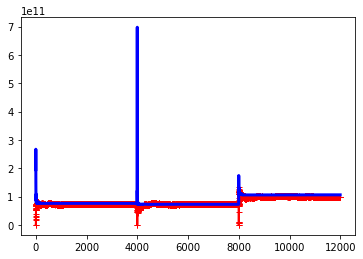

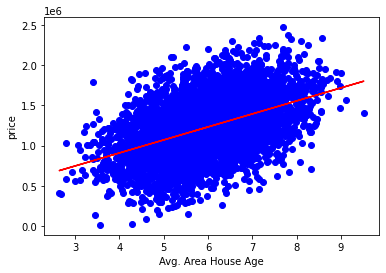

##### ITERACIÓN 1 #####
x      Avg. Area Number of Rooms
222                   8.437966
y 222    1.696717e+06
Name: Price, dtype: float64
y_train_predict [1696717.10729937]
##### ITERACIÓN 2 #####
x      Avg. Area Number of Rooms
222                   8.437966
104                   6.734045
y 222    1.696717e+06
104    1.241484e+06
Name: Price, dtype: float64
y_train_predict [1696717.10729937 1241483.61187325]
##### ITERACIÓN 3 #####
x       Avg. Area Number of Rooms
222                    8.437966
104                    6.734045
3915                   7.914387
y 222     1.696717e+06
104     1.241484e+06
3915    1.397944e+06
Name: Price, dtype: float64
y_train_predict [1626801.94267302 1210470.41382702 1498871.87608829]


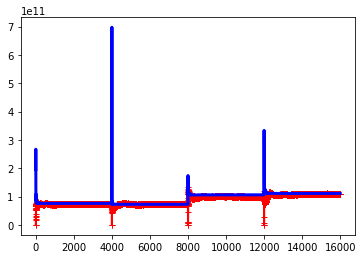

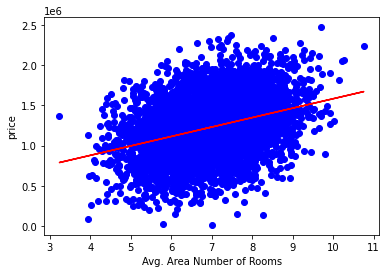

##### ITERACIÓN 1 #####
x       Avg. Area Number of Bedrooms
4322                          2.45
y 4322    1.734239e+06
Name: Price, dtype: float64
y_train_predict [1734239.1383592]
##### ITERACIÓN 2 #####
x       Avg. Area Number of Bedrooms
4322                          2.45
4725                          4.09
y 4322    1.734239e+06
4725    1.794212e+06
Name: Price, dtype: float64
y_train_predict [1734239.1383592  1794212.18576671]
##### ITERACIÓN 3 #####
x       Avg. Area Number of Bedrooms
4322                          2.45
4725                          4.09
4135                          6.37
y 4322    1.734239e+06
4725    1.794212e+06
4135    1.059114e+06
Name: Price, dtype: float64
y_train_predict [1865846.23499764 1567940.33540589 1153778.47499785]


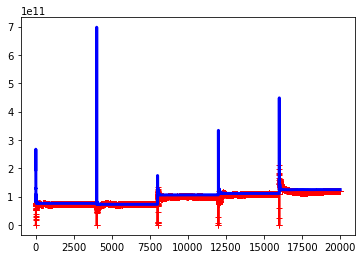

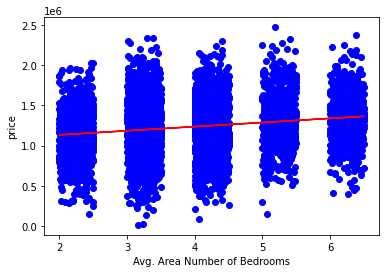

##### ITERACIÓN 1 #####
x       Area Population
2326     33413.265678
y 2326    1.114667e+06
Name: Price, dtype: float64
y_train_predict [1114667.24948651]
##### ITERACIÓN 2 #####
x       Area Population
2326     33413.265678
3595     38074.140204
y 2326    1.114667e+06
3595    1.295015e+06
Name: Price, dtype: float64
y_train_predict [1114667.24948651 1295014.61828102]
##### ITERACIÓN 3 #####
x       Area Population
2326     33413.265678
3595     38074.140204
2507     43672.628549
y 2326    1.114667e+06
3595    1.295015e+06
2507    1.620949e+06
Name: Price, dtype: float64
y_train_predict [1096651.64823947 1328028.63548044 1605951.02095821]


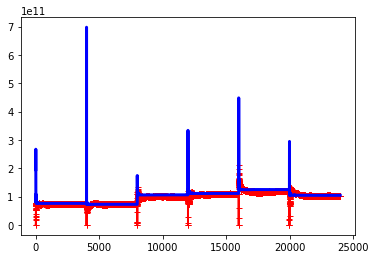

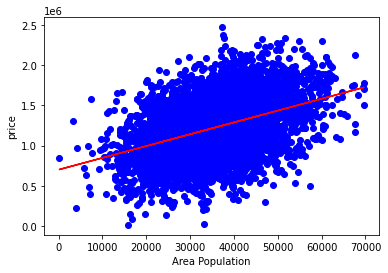

In [14]:
lr_df(df_short)